# Forecast Electric power consumption - Using Profet Model

## Table of Content
<ul>
    <li><a href="#prophet1">Modeling with Prophet Befor Augmenting</a></li>
    <li><a href="#prophet2">Modeling with Prophet After Augmenting</a></li>
</ul>

In [11]:
import pandas as pd
import math
import numpy as np
# ---------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot
# ---------------------------------------

from prophet import Prophet
import holidays
from sklearn.metrics import mean_squared_error, mean_absolute_error
# ---------------------------------------

from statsmodels.tsa.arima.model import ARIMA

import warnings
warnings.filterwarnings("ignore")

In [15]:
def calc_order(df, train_len, steps,p_values, d_values, q_values) :
    p_ret = 0
    d_ret = 0
    q_ret = 0
    rmse = 1000
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order=(p,d,q)
                train = df[:train_len]
                test = df[train_len:]
                model=ARIMA(train,order = (p,d,q))
                model_fit=model.fit()
                y_pred=model_fit.forecast(steps=steps)
                error=np.sqrt(mean_squared_error(test,y_pred))
                if error < rmse and error >= 0:
                    rmse = error
                    p_ret = p
                    d_ret = d
                    q_ret = q
    return [p_ret, d_ret, q_ret]

#--------------------------------------------

def plot_train_test(df,col,train_len):
    train = df[:train_len]
    test = df[train_len:]
    
    train_samples = go.Scatter(x = train.index,
                  y = train[col],
                  mode = 'lines',
                  name = 'Train')

    test_samples = go.Scatter(x = test.index,
                  y = test[col],
                  mode = 'lines',
                  name = 'Test')

    layout = go.Layout(title={'text': 'Train/test split',
                          'y':0.9,
                          'x':0.5,
                          'xanchor': 'center',
                          'yanchor': 'top'},
                   xaxis = dict(title = 'Datetime'),
                   yaxis = dict(title = 'current'),
                   template = 'plotly_dark')

    data = [train_samples, test_samples]
    fig = go.Figure(data = data, layout = layout)
    iplot(fig)

#--------------------------------------------

def prophet_modeling(df, tr, all) :
    train_len = math.floor((df.shape[0]*tr)/all)

    train = df[:train_len]
    test = df[train_len:]

    prophet_model = Prophet()
    prophet_model.fit(train)

    test_forecast = prophet_model.predict(test)
    
    MAPE(test['y'].tolist(),test_forecast['yhat'].tolist())
    
    f, ax = plt.subplots(1)
    f.set_figheight(5)
    f.set_figwidth(15)

    # Plotting the training data
    ax.plot(pd.to_datetime(train['ds']), train['y'], label='Train Data', color='blue')

    # Plotting the test data
    ax.plot(pd.to_datetime(test['ds']), test['y'], label='Test Data', color='red', alpha=0.5)

    # Plotting the forecasted data
    ax.plot(pd.to_datetime(test_forecast['ds']), test_forecast['yhat'], label='Forecast', color='green')

    ax.fill_between(pd.to_datetime(test_forecast['ds']), 
                    test_forecast['yhat_lower'], 
                    test_forecast['yhat_upper'], 
                    color='green', alpha=0.5, label='Confidence Interval')

    plt.title("Prophet Model - Train, Test, and Forecast")
    plt.legend()
    plt.show()
#--------------------------------------------

def MAPE(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    acc = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    print("Accuracy is ", 100 - acc)
    return acc

<a id='prophet1'> </a>
## Modeling with Prophet before Augmenting
###  9 months train / 3 months test

modeling with prophet phase 1 with 9 months train / 3 months test


15:08:20 - cmdstanpy - INFO - Chain [1] start processing
15:08:21 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  79.40239732543857


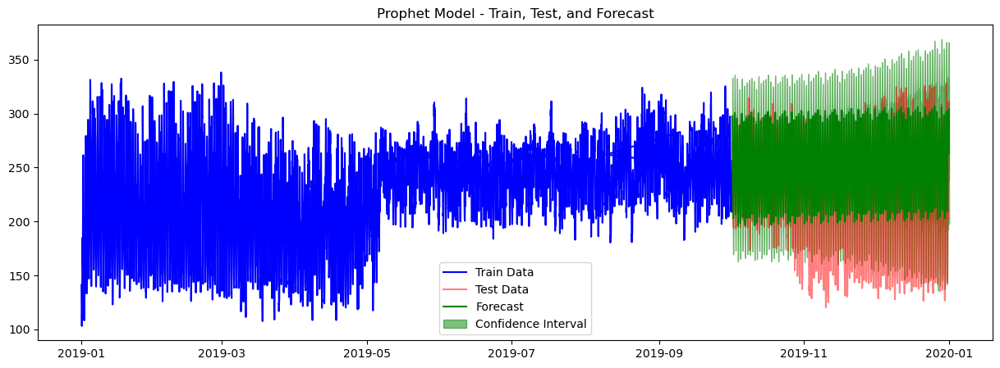

modeling with prophet phase 2 with 9 months train / 3 months test


15:08:24 - cmdstanpy - INFO - Chain [1] start processing
15:08:25 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  78.45289242790534


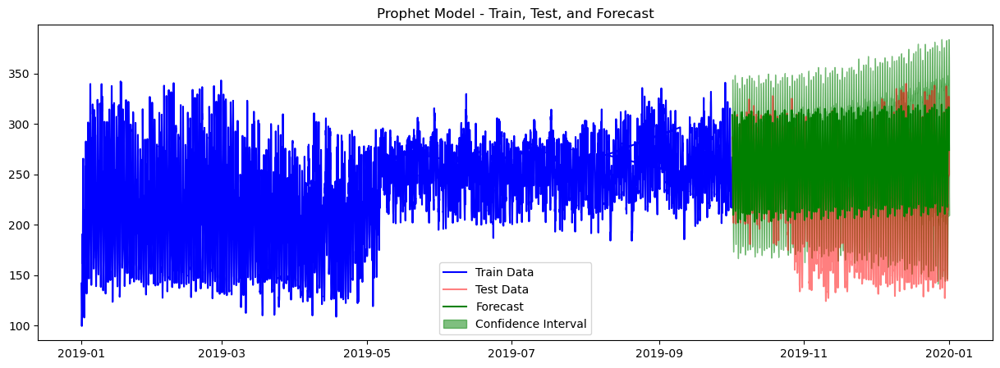

modeling with prophet phase 3 with 9 months train / 3 months test


15:08:28 - cmdstanpy - INFO - Chain [1] start processing
15:08:29 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  79.25187106991041


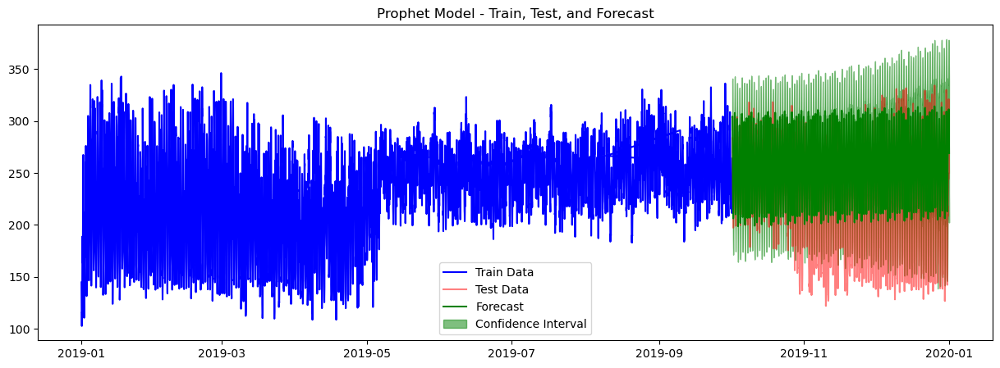

In [16]:
df = pd.read_csv('input_data2019.csv')
df = df.dropna()

df_i1 = pd.DataFrame({
    'ds': df['Datetime'],
    'y': df['I1']
});

df_i2 = pd.DataFrame({
    'ds': df['Datetime'],
    'y': df['I2']
});

df_i3 = pd.DataFrame({
    'ds': df['Datetime'],
    'y': df['I3']
});

df.set_index('Datetime', inplace=True)
plot_train_test(df, 'I1', 6546)

print("modeling with prophet phase 1 with 9 months train / 3 months test")
prophet_modeling(df_i1, 9, 12)

print("modeling with prophet phase 2 with 9 months train / 3 months test")
prophet_modeling(df_i2, 9, 12)

print("modeling with prophet phase 3 with 9 months train / 3 months test")
prophet_modeling(df_i3, 9, 12)


### 10 months train / 2 months test

modeling with prophet phase 1 with 10 months train / 2 months test


15:08:32 - cmdstanpy - INFO - Chain [1] start processing
15:08:33 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  86.02651828146999


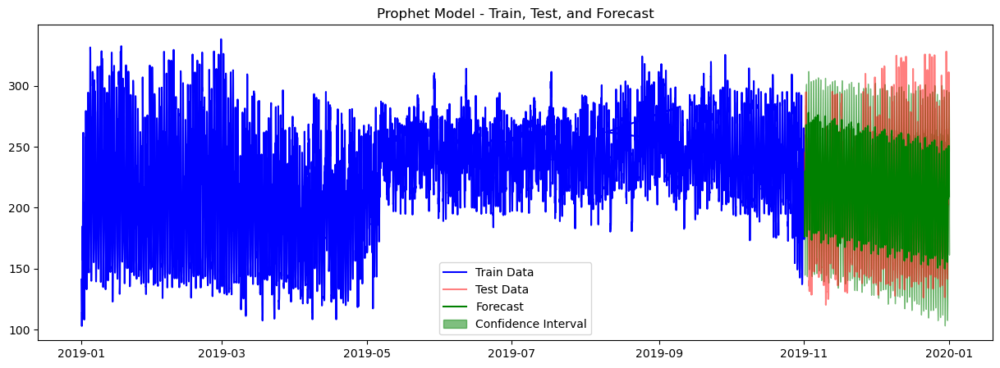

modeling with prophet phase 2 with 10 months train / 2 months test


15:08:36 - cmdstanpy - INFO - Chain [1] start processing
15:08:37 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  85.54666237530981


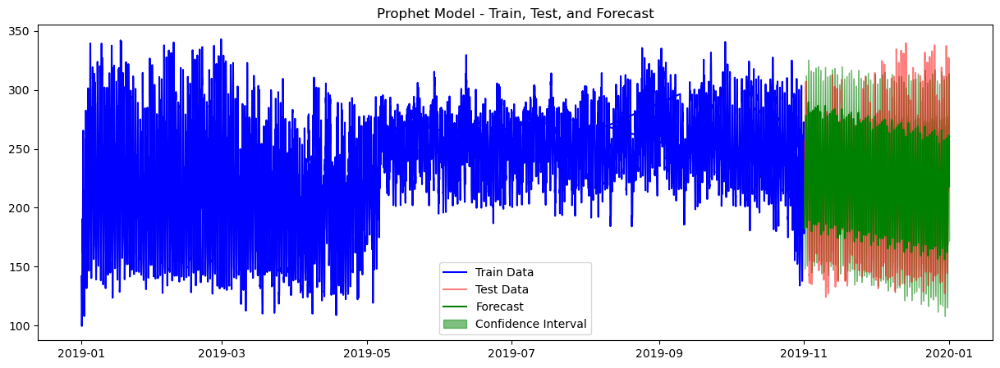

modeling with prophet phase 3 with 10 months train / 2 months test


15:08:40 - cmdstanpy - INFO - Chain [1] start processing
15:08:41 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  85.97845230743815


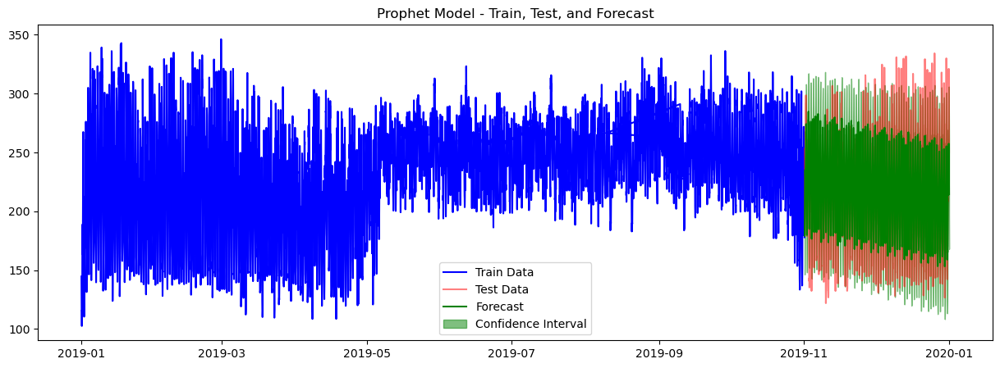

In [17]:
plot_train_test(df, 'I1', 7290)

print("modeling with prophet phase 1 with 10 months train / 2 months test")
prophet_modeling(df_i1, 10, 12)

print("modeling with prophet phase 2 with 10 months train / 2 months test")
prophet_modeling(df_i2, 10, 12)

print("modeling with prophet phase 3 with 10 months train / 2 months test")
prophet_modeling(df_i3, 10, 12)

###  11 months train / 1 month test

modeling with prophet phase 1 with 11 months train / 1 month test


15:09:18 - cmdstanpy - INFO - Chain [1] start processing
15:09:19 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  82.71032253864618


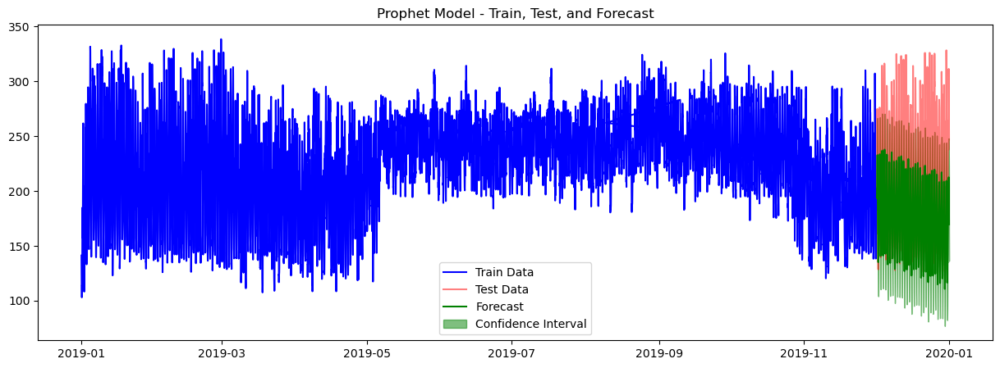

modeling with prophet phase 2 with 11 months train / 1 month test


15:09:21 - cmdstanpy - INFO - Chain [1] start processing
15:09:24 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  83.06903159935504


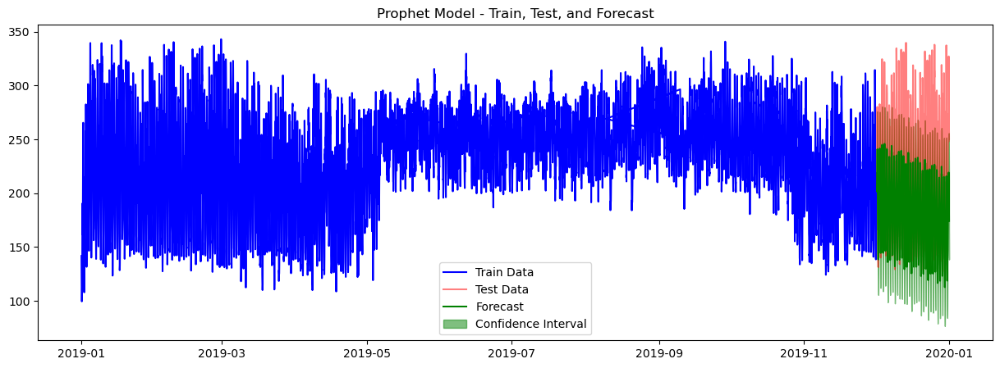

modeling with prophet phase 3 with 11 months train / 1 month test


15:09:26 - cmdstanpy - INFO - Chain [1] start processing
15:09:29 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  83.07470542316025


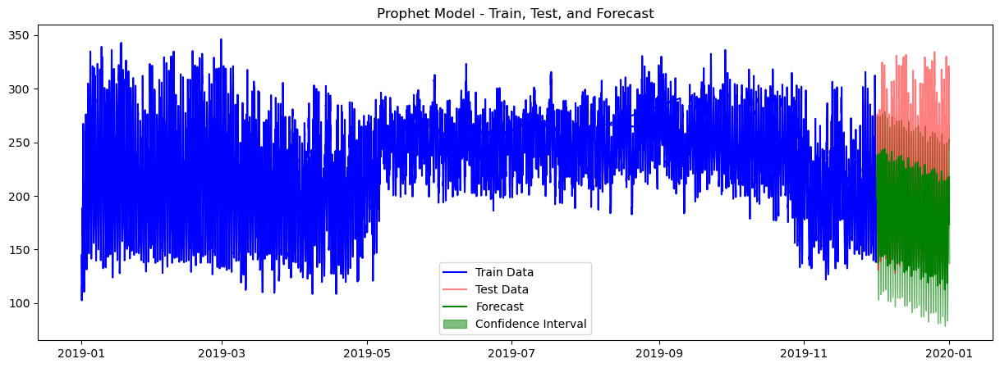

In [18]:
plot_train_test(df, 'I1', 8010)

print("modeling with prophet phase 1 with 11 months train / 1 month test")
prophet_modeling(df_i1, 11, 12)

print("modeling with prophet phase 2 with 11 months train / 1 month test")
prophet_modeling(df_i2, 11, 12)

print("modeling with prophet phase 3 with 11 months train / 1 month test")
prophet_modeling(df_i3, 11, 12)

<a id='prophet2'> </a>
## Modeling with Prophet After Augmenting
###  36 months train / 12 months test

modeling with prophet phase 1 with 36 months train / 12 months test


15:10:16 - cmdstanpy - INFO - Chain [1] start processing
15:10:20 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  82.57644412552963


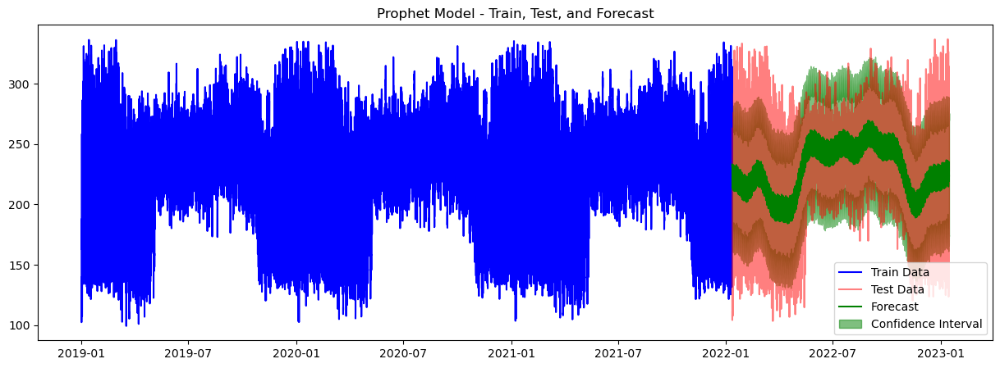

modeling with prophet phase 2 with 36 months train / 12 months test


15:10:34 - cmdstanpy - INFO - Chain [1] start processing
15:10:36 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  81.99405907972411


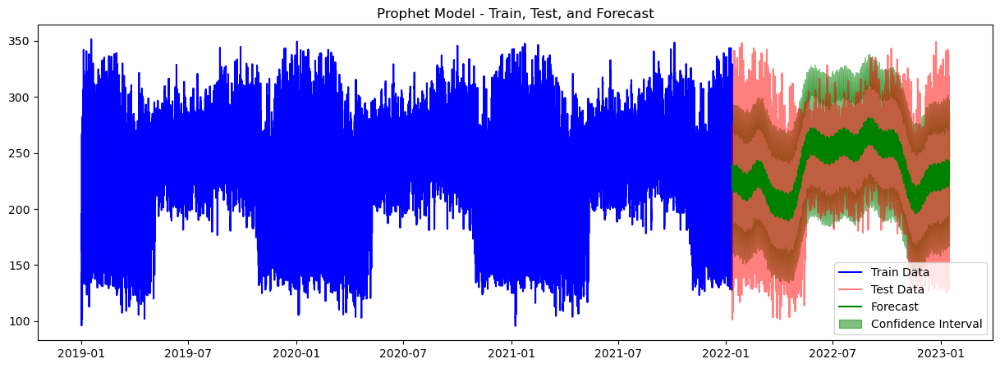

modeling with prophet phase 3 with 36 months train / 12 months test


15:10:50 - cmdstanpy - INFO - Chain [1] start processing
15:10:54 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  82.288241495703


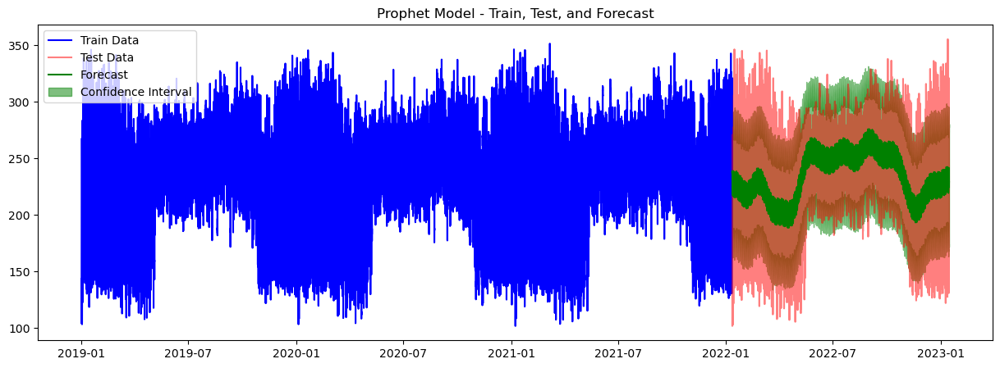

In [19]:
df = pd.read_csv('input_data2019-augmented.csv')
df = df.dropna()

df_i1 = pd.DataFrame({
    'ds': df['Datetime'],
    'y': df['I1']
});

df_i2 = pd.DataFrame({
    'ds': df['Datetime'],
    'y': df['I2']
});

df_i3 = pd.DataFrame({
    'ds': df['Datetime'],
    'y': df['I3']
});

df.set_index('Datetime', inplace=True)
plot_train_test(df, 'I1', 26305)

print("modeling with prophet phase 1 with 36 months train / 12 months test")
prophet_modeling(df_i1, 36, 48)

print("modeling with prophet phase 2 with 36 months train / 12 months test")
prophet_modeling(df_i2, 36, 48)

print("modeling with prophet phase 3 with 36 months train / 12 months test")
prophet_modeling(df_i3, 36, 48)

### 42 months training, 6 months testing

modeling with prophet phase 1 with 42 months train / 6 months test


15:11:10 - cmdstanpy - INFO - Chain [1] start processing
15:11:15 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  85.35135655481683


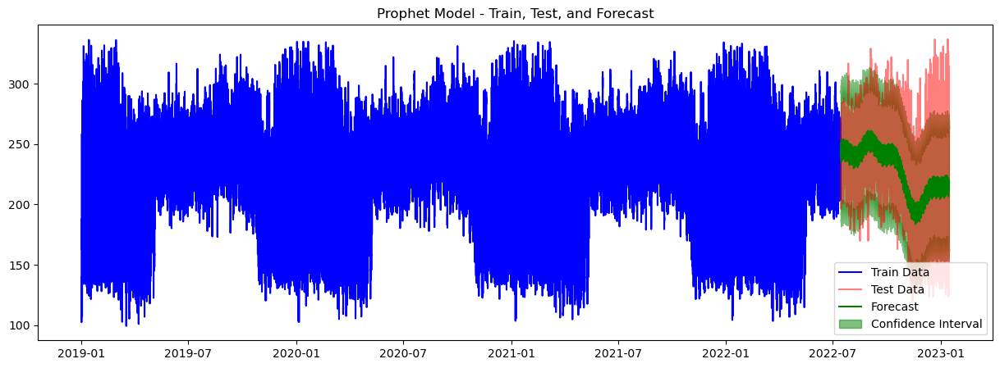

modeling with prophet phase 2 with 42 months train / 6 months test


15:11:26 - cmdstanpy - INFO - Chain [1] start processing
15:11:32 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  84.93067483420317


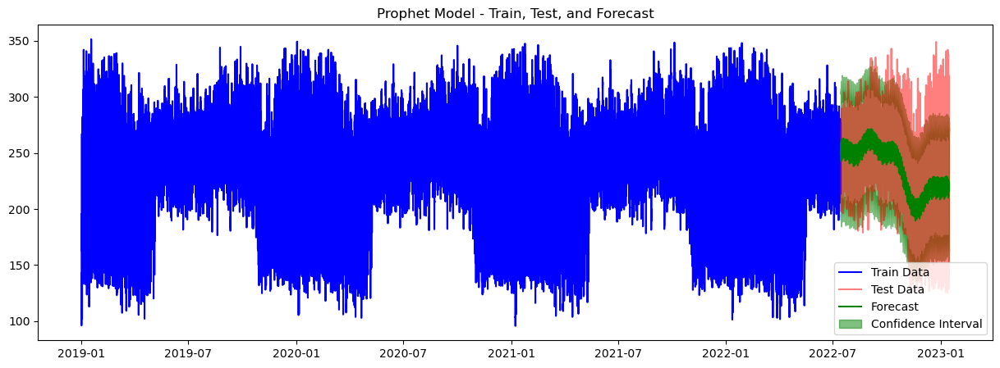

modeling with prophet phase 3 with 42 months train / 6 months test


15:11:42 - cmdstanpy - INFO - Chain [1] start processing
15:11:49 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  85.200712693193


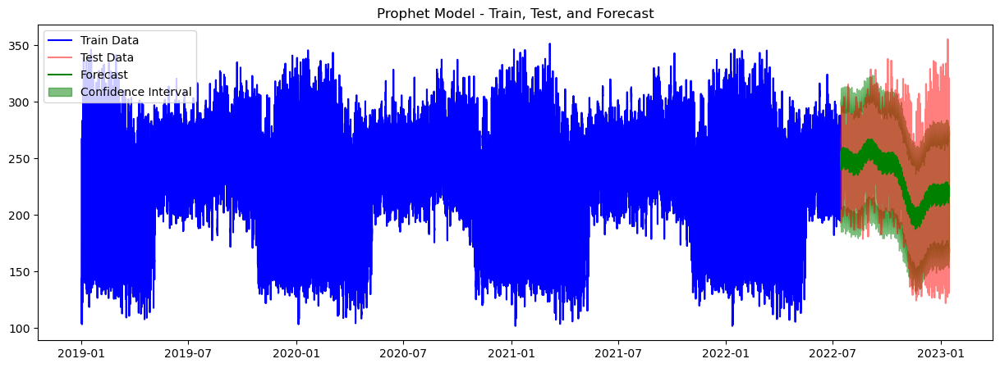

In [20]:
plot_train_test(df, 'I1', 30649)

print("modeling with prophet phase 1 with 42 months train / 6 months test")
prophet_modeling(df_i1, 42, 48)

print("modeling with prophet phase 2 with 42 months train / 6 months test")
prophet_modeling(df_i2, 42, 48)

print("modeling with prophet phase 3 with 42 months train / 6 months test")
prophet_modeling(df_i3, 42, 48)

### 45 months training, 6 months testing

modeling with prophet phase 1 with 45 months train / 3 months test


15:12:03 - cmdstanpy - INFO - Chain [1] start processing
15:12:09 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  81.07730262527299


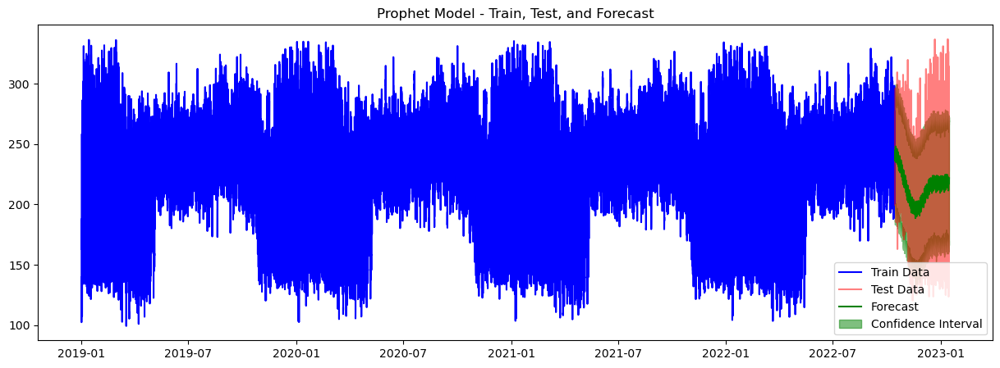

modeling with prophet phase 2 with 45 months train / 3 months test


15:12:21 - cmdstanpy - INFO - Chain [1] start processing
15:12:28 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  80.56408240495458


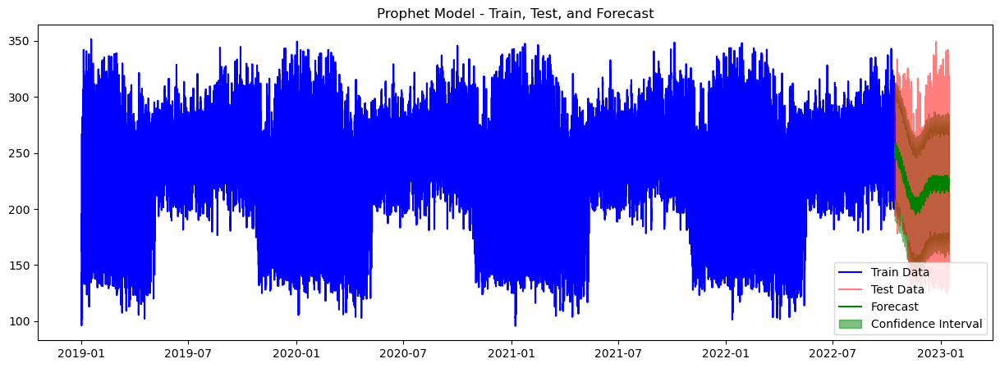

modeling with prophet phase 3 with 45 months train / 3 months test


15:12:40 - cmdstanpy - INFO - Chain [1] start processing
15:12:44 - cmdstanpy - INFO - Chain [1] done processing


Accuracy is  80.86410995950163


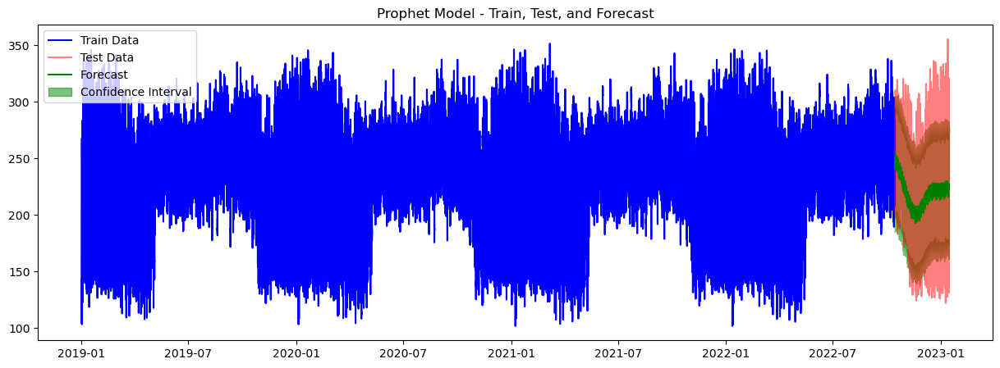

In [21]:
plot_train_test(df, 'I1', 32857)
print("modeling with prophet phase 1 with 45 months train / 3 months test")
prophet_modeling(df_i1, 45, 48)

print("modeling with prophet phase 2 with 45 months train / 3 months test")
prophet_modeling(df_i2, 45, 48)

print("modeling with prophet phase 3 with 45 months train / 3 months test")
prophet_modeling(df_i3, 45, 48)